<a href="https://colab.research.google.com/github/tomynie/Projet-GPI-TomA/blob/main/GPI_Aydin_Tom.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install biopython mrcfile gdown scikit-image

import os
import numpy as np
import matplotlib.pyplot as plt
import urllib.request
import mrcfile
import gdown
import collections

from skimage import transform, filters
from skimage.feature import match_template, peak_local_max
from skimage.transform import rotate
from Bio.PDB import PDBParser
import matplotlib.patches as patches

np.random.seed(42)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.0/45.0 kB 2.8 MB/s eta 0:00:00


Downloading...
From (original): https://drive.google.com/uc?id=1Qj30jSXcHEpkzE04cisbP6ljtnQ2Ausr
From (redirected): https://drive.google.com/uc?id=1Qj30jSXcHEpkzE04cisbP6ljtnQ2Ausr&confirm=t&uuid=fcbd494e-059d-4bc2-bb8e-77b199d0223b
To: /content/map.mrc
100%|██████████| 228M/228M [00:07<00:00, 32.0MB/s]
/usr/local/lib/python3.12/dist-packages/mrcfile/mrcinterpreter.py:206: RuntimeWarning: Map ID string not found - not an MRC file, or file is corrupt
  warnings.warn(msg, RuntimeWarning)
/usr/local/lib/python3.12/dist-packages/mrcfile/mrcinterpreter.py:216: RuntimeWarning: Unrecognised machine stamp: 0x00 0x00 0x00 0x00
  warnings.warn(str(err), RuntimeWarning)


Image chargee : (7676, 7420), dtype=float32


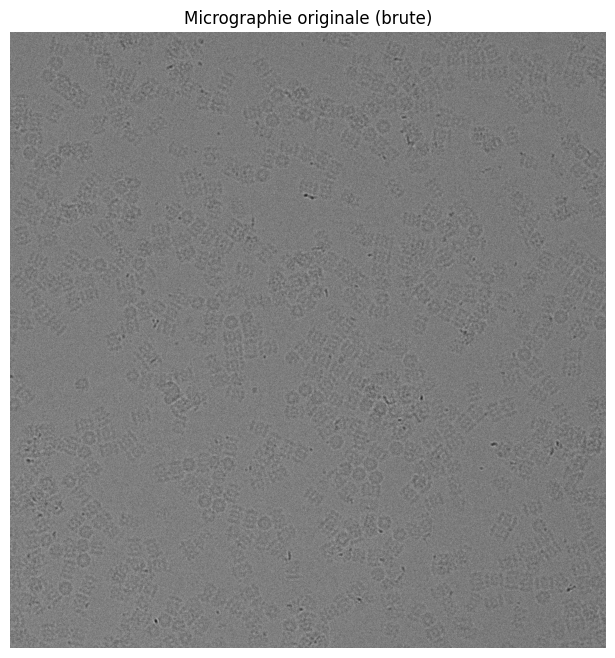

In [2]:
file_id = '1Qj30jSXcHEpkzE04cisbP6ljtnQ2Ausr'
output_file = 'map.mrc'

# si le fichier est corrompu on le supprime et on retelecharge
if os.path.exists(output_file) and os.path.getsize(output_file) < 1000:
    os.remove(output_file)

if not os.path.exists(output_file):
    gdown.download(id=file_id, output=output_file, quiet=False, fuzzy=True)

with mrcfile.open(output_file, permissive=True) as mrc:
    raw_image = mrc.data.copy()

image_2d = np.squeeze(raw_image)
print(f'Image chargee : {image_2d.shape}, dtype={image_2d.dtype}')

vmin, vmax = np.percentile(image_2d, [5, 95])
plt.figure(figsize=(8, 8))
plt.imshow(image_2d, cmap='gray', vmin=vmin, vmax=vmax)
plt.title('Micrographie originale (brute)')
plt.axis('off')
plt.show()

étape 1 :

1- bining

-> Application du binning x2...
Taille avant : (7676, 7420)
Taille apres : (3838, 3710)


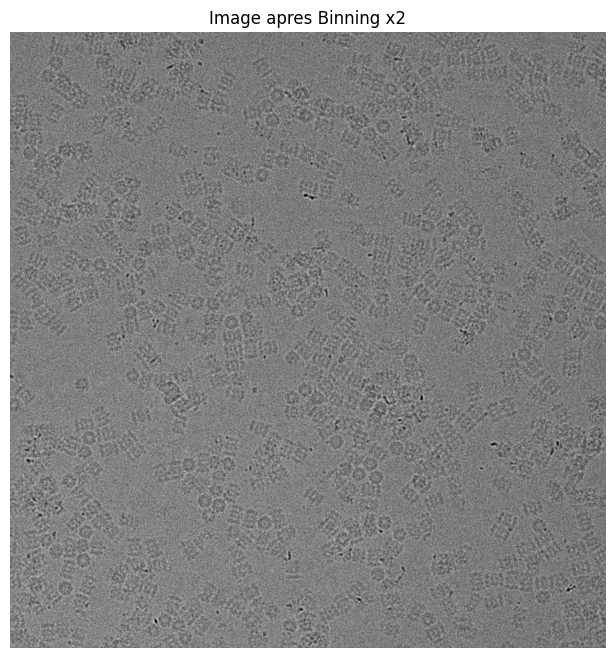

In [3]:
# ==========================================
# 1.1 Binning
# ==========================================

bin_factor = 2
print(f'-> Application du binning x{bin_factor}...')
print(f'Taille avant : {image_2d.shape}')

# downscale_local_mean fait la moyenne des blocs de pixels
# c'est mieux que de juste prendre 1 pixel sur 2 (evite l'aliasing)
img_binned = transform.downscale_local_mean(image_2d, (bin_factor, bin_factor))

print(f'Taille apres : {img_binned.shape}')

vmin, vmax = np.percentile(img_binned, [5, 95])
plt.figure(figsize=(8, 8))
plt.imshow(img_binned, cmap='gray', vmin=vmin, vmax=vmax)
plt.title(f'Image apres Binning x{bin_factor}')
plt.axis('off')
plt.show()

2: Normalize the image

-> Normalisation Z-score...
Avant - Moyenne: 16.03, Ecart-type: 2.08
Apres - Moyenne: -0.00, Ecart-type: 1.00


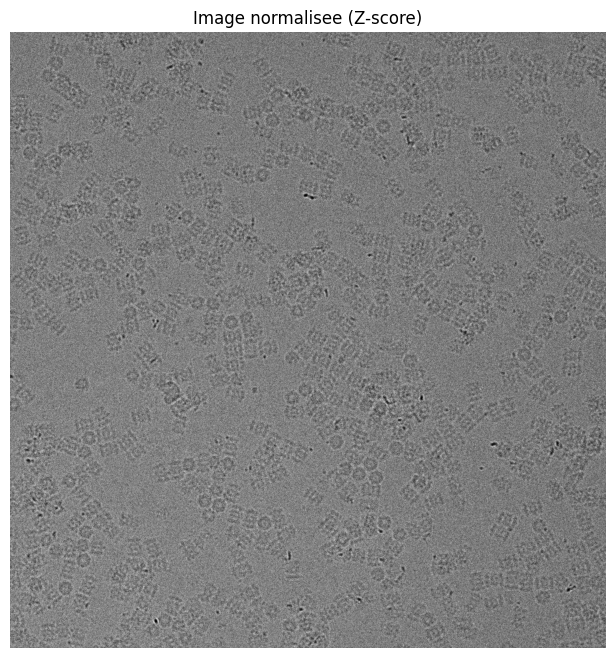

In [4]:
# ==========================================
# 1.2 Normalisation
# ==========================================
# j'utilise le Z-score pour ramener la moyenne a 0 et l'ecart-type a 1
# c'est necessaire pour que la NCC fonctionne correctement

print('-> Normalisation Z-score...')

mean_before = np.mean(img_binned)
std_before = np.std(img_binned)
print(f'Avant - Moyenne: {mean_before:.2f}, Ecart-type: {std_before:.2f}')

img_norm = (img_binned - mean_before) / std_before

print(f'Apres - Moyenne: {img_norm.mean():.2f}, Ecart-type: {img_norm.std():.2f}')

vmin, vmax = np.percentile(img_norm, [5, 95])
plt.figure(figsize=(8, 8))
plt.imshow(img_norm, cmap='gray', vmin=vmin, vmax=vmax)
plt.title('Image normalisee (Z-score)')
plt.axis('off')
plt.show()

3: Padding

-> Padding de 100px de chaque cote...
Avant: (3838, 3710) -> Apres: (4038, 3910)


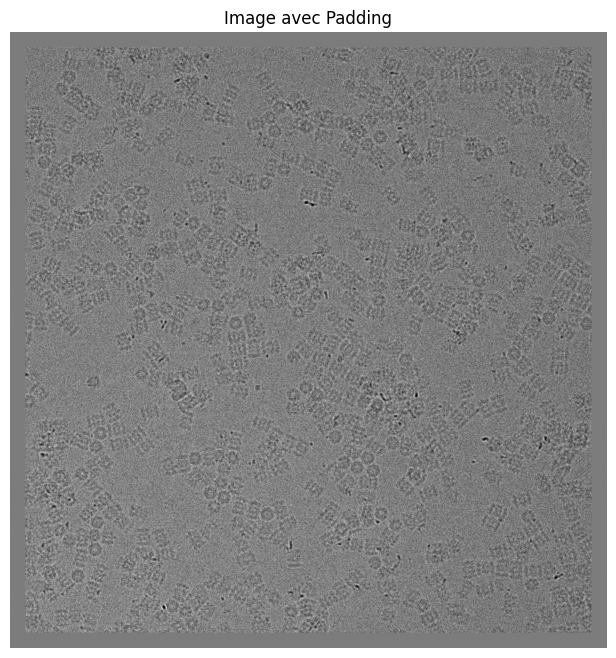

In [5]:
# ==========================================
# 1.3 Padding
# ==========================================
# j'ajoute une bordure autour de l'image pour eviter les effets de bord
# quand le template va glisser sur les extremites de la micrographie.
# Comme l'image est normalisee (moyenne=0), mettre des zeros = fond neutre

pad_size = 100
print(f'-> Padding de {pad_size}px de chaque cote...')

img_padded = np.pad(img_norm, pad_width=pad_size, mode='constant', constant_values=0)

print(f'Avant: {img_norm.shape} -> Apres: {img_padded.shape}')

vmin, vmax = np.percentile(img_padded, [5, 95])
plt.figure(figsize=(8, 8))
plt.imshow(img_padded, cmap='gray', vmin=vmin, vmax=vmax)
plt.title('Image avec Padding')
plt.axis('off')
plt.show()

Chek the image format that the cc function accepts

In [6]:
# check que l'image est bien en float32 (format attendu par match_template)
print(f'Dimensions: {img_padded.ndim}D, shape: {img_padded.shape}')
print(f'Type actuel: {img_padded.dtype}')

img_final = img_padded.astype(np.float32)

print(f'Type apres conversion: {img_final.dtype}')
print('=> Etape 1 terminee !')

Dimensions: 2D, shape: (4038, 3910)
Type actuel: float32
Type apres conversion: float32
=> Etape 1 terminee !


optional : denoise (filtrer), crop the image to make a test image

Taille image de test : (512, 512)


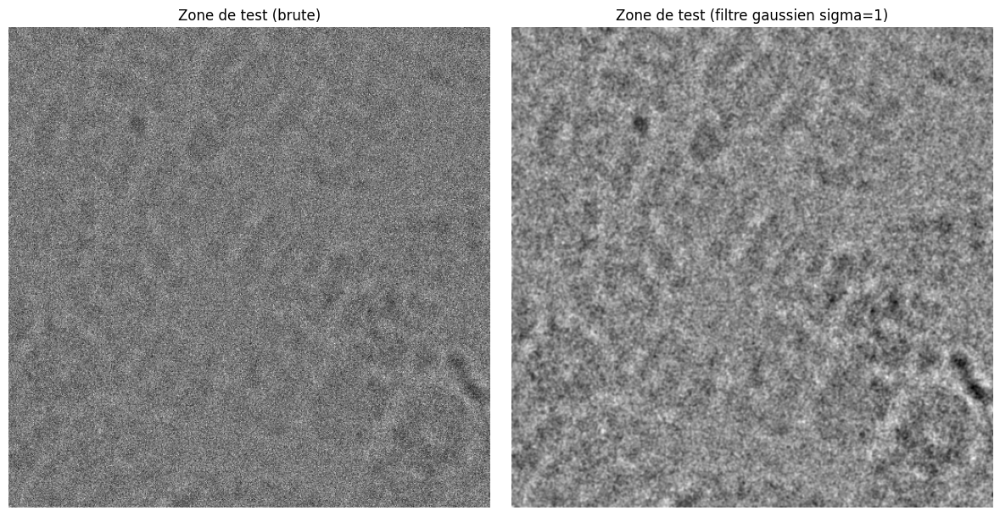

In [7]:
# optionnel : on crop une zone de 512x512 pour tester le pipeline
# plus rapide que de faire tourner la NCC sur toute l'image

h, w = img_final.shape
start_y, start_x = h // 2, w // 2
img_test_raw = img_final[start_y:start_y + 512, start_x:start_x + 512]

# filtre gaussien leger pour reduire le bruit sans trop flouter
img_test = filters.gaussian(img_test_raw, sigma=1).astype(np.float32)

print(f'Taille image de test : {img_test.shape}')

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(img_test_raw, cmap='gray')
axes[0].set_title('Zone de test (brute)')
axes[0].axis('off')
axes[1].imshow(img_test, cmap='gray')
axes[1].set_title('Zone de test (filtre gaussien sigma=1)')
axes[1].axis('off')
plt.tight_layout()
plt.show()

étape 2 : Prepare the template



1- Import the pdb



In [8]:
# ==========================================
# 2.1 Import du modele PDB
# ==========================================
# le fichier PDB contient les coordonnees 3D de chaque atome
# on le recupere directement depuis la banque de donnees RCSB

pdb_id = '6BDF'
pdb_file = f'{pdb_id}.pdb'

if not os.path.exists(pdb_file):
    url = f'https://files.rcsb.org/download/{pdb_id}.pdb'
    urllib.request.urlretrieve(url, pdb_file)
    print('Telechargement OK')
else:
    print('Fichier PDB deja present.')

parser = PDBParser(QUIET=True)
structure = parser.get_structure(pdb_id, pdb_file)

nb_atomes = len(list(structure.get_atoms()))
print(f'Structure {pdb_id} chargee : {nb_atomes} atomes')

Telechargement OK
Structure 6BDF chargee : 46382 atomes


2- Make projections (check pixel sixe (if px size matches the dimensions will match just need to choose box size in which particle will fit), normalization, image format)

### Justification du pixel size

Le pixel size est une valeur cle pour que le template soit a la bonne echelle par rapport a la micrographie.

| Parametre | Valeur |
|---|---|
| Pixel size initial (donne par le microscope) | 0.66 A/px |
| Facteur de binning applique | x 4 |
| **Pixel size final utilise** | **0.66 x 4 = 2.64 A/px** |

Si le pixel size du template ne correspond pas a celui de la micrographie, la proteine apparaitra trop grande ou trop petite dans le template, et la NCC ne pourra pas la detecter correctement.

Template genere : 73x73 px, pixel_size=2.64 A/px
Moyenne=0.00, Ecart-type=1.00


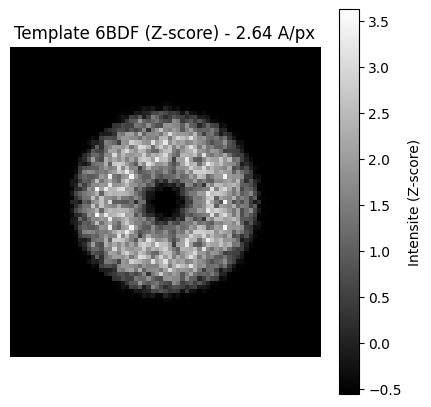

In [10]:
# ==========================================
# 2.2 Projection 2D du modele (template)
# ==========================================
# on projette les atomes sur le plan XY via un histogramme 2D
# le pixel_size doit etre le meme que celui de la micrographie
# sinon la proteine aura la mauvaise taille dans le template

coords = np.array([atom.get_coord() for atom in structure.get_atoms()])
coords -= coords.mean(axis=0)  # centrage

# pixel size = 0.66 A/px (donne par le microscope) x binning 4 = 2.64 A/px
pixel_size = 2.64
marge = 30  # marge en Angstroms pour que la proteine tienne dans la boite

diametre = np.max(coords) - np.min(coords)
box_size = int((diametre + marge) / pixel_size)
limite = (box_size * pixel_size) / 2

template_raw, _, _ = np.histogram2d(
    coords[:, 0], coords[:, 1],
    bins=box_size,
    range=[[-limite, limite], [-limite, limite]]
)

# normalisation Z-score comme pour l'image
t_mean = np.mean(template_raw)
t_std = np.std(template_raw)
template_final = ((template_raw - t_mean) / (t_std + 1e-10)).T.astype('float32')

print(f'Template genere : {box_size}x{box_size} px, pixel_size={pixel_size} A/px')
print(f'Moyenne={template_final.mean():.2f}, Ecart-type={template_final.std():.2f}')

plt.figure(figsize=(5, 5))
plt.imshow(template_final, cmap='gray', origin='lower')
plt.title(f'Template 6BDF (Z-score) - {pixel_size} A/px')
plt.colorbar(label='Intensite (Z-score)')
plt.axis('off')
plt.show()

Bonus- add noise

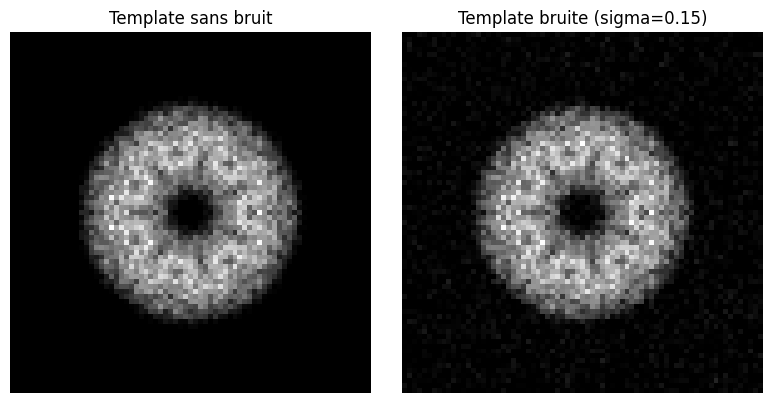

In [11]:
# optionnel : ajout de bruit gaussien sur le template
# pour simuler les conditions reelles du cryo-EM (SNR tres faible)

niveau_de_bruit = 0.15
bruit = np.random.normal(0.0, niveau_de_bruit, size=template_final.shape)
template_bruit = np.clip(
    template_final + bruit,
    template_final.min(),
    template_final.max()
).astype('float32')

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(template_final, cmap='gray', origin='lower')
axes[0].set_title('Template sans bruit')
axes[0].axis('off')
axes[1].imshow(template_bruit, cmap='gray', origin='lower')
axes[1].set_title(f'Template bruite (sigma={niveau_de_bruit})')
axes[1].axis('off')
plt.tight_layout()
plt.show()

# j'utilise le template sans bruit pour la NCC
# on peut remplacer par template_bruit pour tester
template_pour_ncc = template_final

étape 3 : NCC



1-Optimize the shift.


-> Calcul de la NCC...
NCC terminee. Min=-0.223, Max=0.161
243 particules candidates trouvees


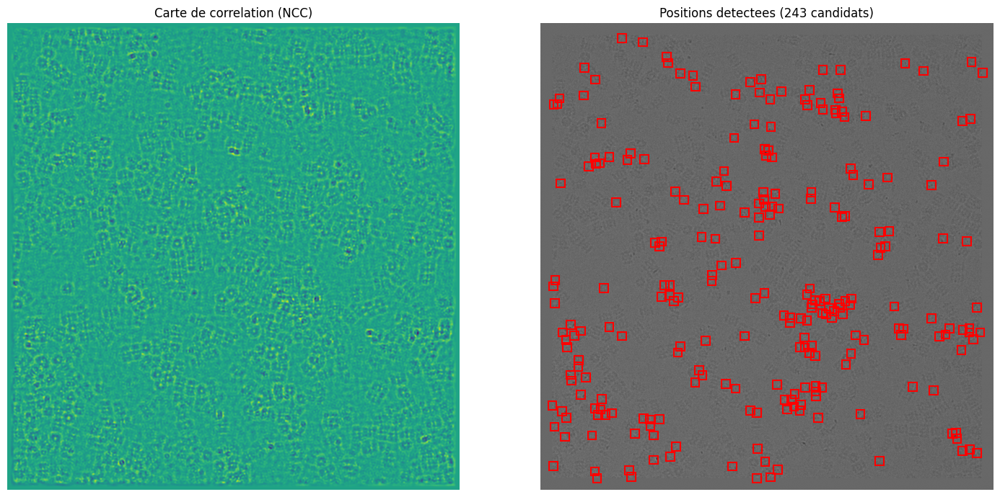

In [12]:
# ==========================================
# 3. NCC - Normalized Cross-Correlation
# ==========================================
# match_template fait glisser le template sur l'image et calcule
# un score de correlation normalise entre -1 et 1
# score proche de 1 = forte ressemblance avec la proteine

image_cible = img_final

print('-> Calcul de la NCC...')
resultat_ncc = match_template(image_cible, template_pour_ncc)
print(f'NCC terminee. Min={resultat_ncc.min():.3f}, Max={resultat_ncc.max():.3f}')

# on extrait les positions ou le score est > 60% du max
coordonnees_pics = peak_local_max(resultat_ncc, min_distance=20, threshold_rel=0.6)
print(f'{len(coordonnees_pics)} particules candidates trouvees')

fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(resultat_ncc, cmap='viridis')
axes[0].set_title('Carte de correlation (NCC)')
axes[0].axis('off')

axes[1].imshow(image_cible, cmap='gray')
axes[1].set_title(f'Positions detectees ({len(coordonnees_pics)} candidats)')
axes[1].axis('off')

h_t, w_t = template_pour_ncc.shape
for y, x in coordonnees_pics:
    rect = patches.Rectangle((x, y), w_t, h_t,
                              linewidth=1.5, edgecolor='red', facecolor='none')
    axes[1].add_patch(rect)

plt.tight_layout()
plt.show()

2- optimize the threshold

-> Utilisation de la carte angulaire (etape 3.2)


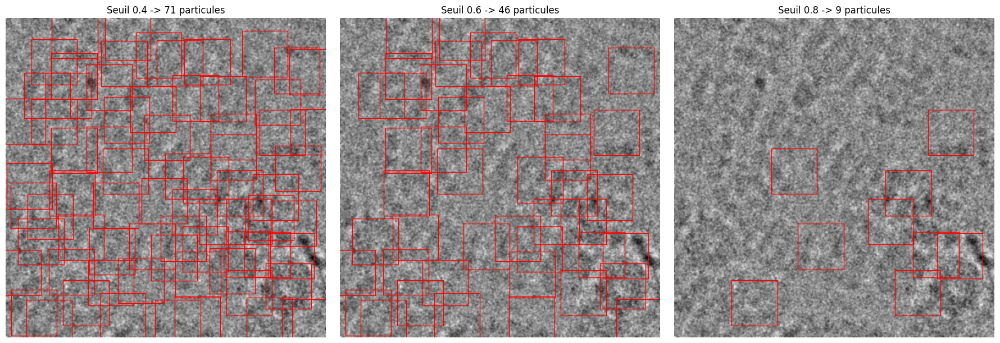

Seuil retenu : 0.6 -> 46 particules


In [14]:
# ==========================================
# 3.1 Optimisation du seuil
# ==========================================
# on compare 3 seuils pour trouver le bon compromis :
# trop bas -> beaucoup de faux positifs
# trop haut -> on rate des vraies particules
#
# NOTE : executer de preference apres l'etape 3.2 (NCC angulaire)
# pour avoir la carte la plus precise. L'ordre conseille est :
# etape 3 -> etape 3.2 -> etape 3.1

try:
    source_donnees = carte_max_ncc
    print('-> Utilisation de la carte angulaire (etape 3.2)')
except NameError:
    source_donnees = resultat_ncc
    print('-> carte_max_ncc non definie, utilisation de la NCC simple.')
    print('   Executer etape 3.2 avant pour plus de precision.')

seuils = [0.4, 0.6, 0.8]
h_t, w_t = template_pour_ncc.shape

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for i, seuil in enumerate(seuils):
    pics = peak_local_max(source_donnees, min_distance=20, threshold_rel=seuil)
    axes[i].imshow(img_test, cmap='gray')
    axes[i].set_title(f'Seuil {seuil} -> {len(pics)} particules')
    axes[i].axis('off')
    for y, x in pics:
        rect = patches.Rectangle(
            (x - w_t / 2, y - h_t / 2), w_t, h_t,
            linewidth=1, edgecolor='red', facecolor='none')
        axes[i].add_patch(rect)

plt.tight_layout()
plt.show()

# j'ai choisi 0.6 : assez strict pour limiter les faux positifs
# mais pas trop pour ne pas rater de vraies particules
seuil_optimal = 0.6
pics_finaux = peak_local_max(source_donnees, min_distance=20, threshold_rel=seuil_optimal)
print(f'Seuil retenu : {seuil_optimal} -> {len(pics_finaux)} particules')

3- optimize if working with side view optimize the angle step

-> Recherche angulaire : 24 angles, pas de 15 deg
-> 46 particules detectees (seuil=0.6)


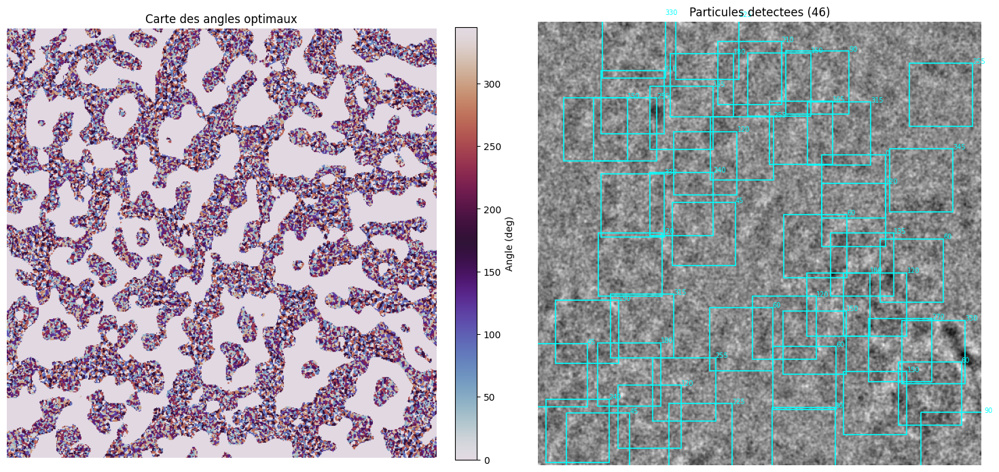

In [13]:
# ==========================================
# 3.2 NCC avec recherche angulaire
# ==========================================
# les particules peuvent etre dans n'importe quelle orientation
# donc on fait tourner le template de 0 a 360 deg et on garde
# le meilleur score NCC pour chaque position de l'image

image_cible = img_test
template_a_tourner = template_pour_ncc

angle_step = 15  # pas angulaire en degres
angles = np.arange(0, 360, angle_step)
carte_max_ncc = np.zeros_like(image_cible, dtype=np.float32)
carte_angles = np.zeros_like(image_cible, dtype=np.float32)

print(f'-> Recherche angulaire : {len(angles)} angles, pas de {angle_step} deg')

for angle in angles:
    temp_rot = rotate(template_a_tourner, angle, resize=False)
    ncc_angle = match_template(image_cible, temp_rot, pad_input=True)
    masque = ncc_angle > carte_max_ncc
    carte_max_ncc[masque] = ncc_angle[masque]
    carte_angles[masque] = angle

seuil = 0.6
pics_orientes = peak_local_max(carte_max_ncc, min_distance=20, threshold_rel=seuil)
print(f'-> {len(pics_orientes)} particules detectees (seuil={seuil})')

fig, axes = plt.subplots(1, 2, figsize=(15, 7))
im = axes[0].imshow(carte_angles, cmap='twilight')
axes[0].set_title('Carte des angles optimaux')
axes[0].axis('off')
plt.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04, label='Angle (deg)')

axes[1].imshow(image_cible, cmap='gray')
axes[1].set_title(f'Particules detectees ({len(pics_orientes)})')
axes[1].axis('off')

h_t, w_t = template_a_tourner.shape
for y, x in pics_orientes:
    rect = patches.Rectangle(
        (x - w_t / 2, y - h_t / 2), w_t, h_t,
        linewidth=1.2, edgecolor='cyan', facecolor='none')
    axes[1].add_patch(rect)
    axes[1].text(x + w_t / 2, y - h_t / 2,
                 f'{int(carte_angles[y, x])}', color='cyan', fontsize=7)

plt.tight_layout()
plt.show()

### Bilan quantitatif de la detection

In [15]:
# quelques stats sur les particules detectees

scores = [carte_max_ncc[y, x] for y, x in pics_orientes]
print(f'Particules detectees : {len(pics_orientes)}')
print(f'Score NCC moyen : {sum(scores)/len(scores):.3f}')
print(f'Score NCC max   : {max(scores):.3f}')
print(f'Score NCC min   : {min(scores):.3f}')

pixel_size = 2.64
h_t, w_t = template_pour_ncc.shape
print(f'\nBoite : {h_t}x{w_t} px = {h_t*pixel_size:.0f}x{w_t*pixel_size:.0f} Angstroms')

print('\nDistribution des angles :')
comptage = collections.Counter([int(carte_angles[y, x]) for y, x in pics_orientes])
for angle, count in sorted(comptage.items()):
    print(f'  {angle:3d} deg : {count} particule(s)')

Particules detectees : 46
Score NCC moyen : 0.244
Score NCC max   : 0.315
Score NCC min   : 0.201

Boite : 73x73 px = 193x193 Angstroms

Distribution des angles :
    0 deg : 1 particule(s)
   30 deg : 1 particule(s)
   45 deg : 3 particule(s)
   60 deg : 5 particule(s)
   90 deg : 2 particule(s)
  120 deg : 6 particule(s)
  135 deg : 2 particule(s)
  150 deg : 5 particule(s)
  165 deg : 1 particule(s)
  180 deg : 3 particule(s)
  210 deg : 2 particule(s)
  225 deg : 2 particule(s)
  240 deg : 2 particule(s)
  255 deg : 4 particule(s)
  270 deg : 1 particule(s)
  315 deg : 2 particule(s)
  330 deg : 3 particule(s)
  345 deg : 1 particule(s)


etape 4 : Extract the particles

-> Utilisation des positions de la recherche angulaire
Boite : 73x73px | 46 candidats
39 particules extraites (7 rejetees, trop pres du bord)


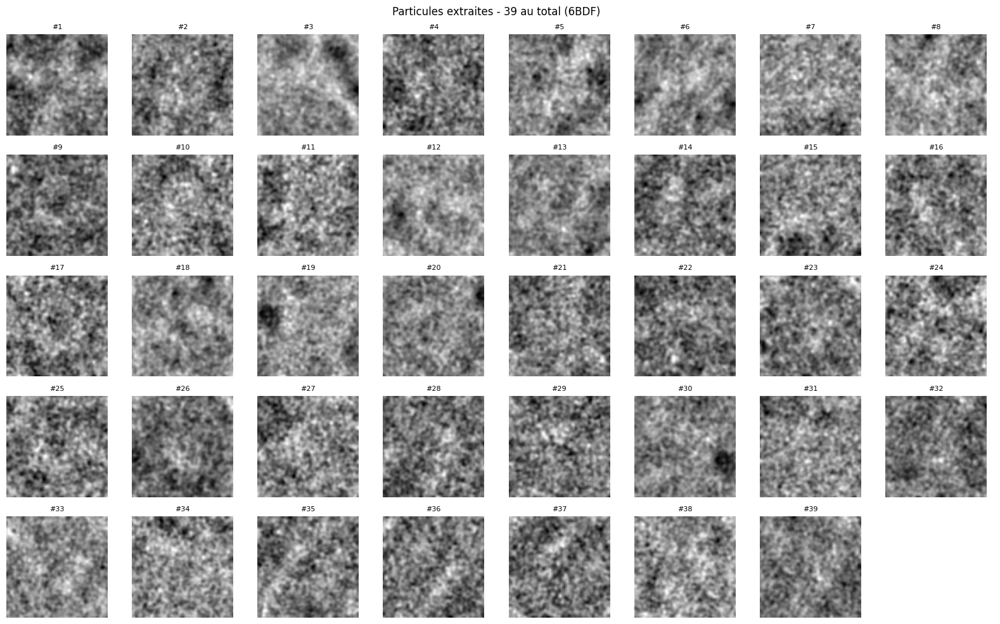

=> 39 particules extraites avec succes !


In [16]:
# ==========================================
# 4. Extraction des particules
# ==========================================
# on decoupe chaque particule detectee dans une boite centree
# sur les coordonnees trouvees a l'etape 3

try:
    coordonnees_finales = pics_orientes
    print('-> Utilisation des positions de la recherche angulaire')
except NameError:
    coordonnees_finales = pics_finaux
    print('-> Utilisation des positions NCC simple')

h_box, w_box = template_pour_ncc.shape
image_source = img_test
print(f'Boite : {h_box}x{w_box}px | {len(coordonnees_finales)} candidats')

particules = []
for y, x in coordonnees_finales:
    y1, y2 = int(y - h_box // 2), int(y + h_box // 2)
    x1, x2 = int(x - w_box // 2), int(x + w_box // 2)
    # on ignore les particules trop pres du bord
    if y1 < 0 or x1 < 0 or y2 > image_source.shape[0] or x2 > image_source.shape[1]:
        continue
    particules.append(image_source[y1:y2, x1:x2].copy())

n = len(particules)
print(f'{n} particules extraites ({len(coordonnees_finales)-n} rejetees, trop pres du bord)')

if n > 0:
    cols = min(8, n)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))

    if rows == 1 and cols == 1:
        axes = [[axes]]
    elif rows == 1:
        axes = [list(axes)]
    elif cols == 1:
        axes = [[ax] for ax in axes]

    for idx in range(rows * cols):
        ax = axes[idx // cols][idx % cols]
        if idx < n:
            ax.imshow(particules[idx], cmap='gray')
            ax.set_title(f'#{idx+1}', fontsize=8)
        ax.axis('off')

    plt.suptitle(f'Particules extraites - {n} au total (6BDF)', fontsize=12)
    plt.tight_layout()
    plt.show()
    print(f'=> {n} particules extraites avec succes !')
else:
    print('Aucune particule extraite, verifier les seuils')

### Particules extraites : image moyenne

39 particules utilisees pour la moyenne


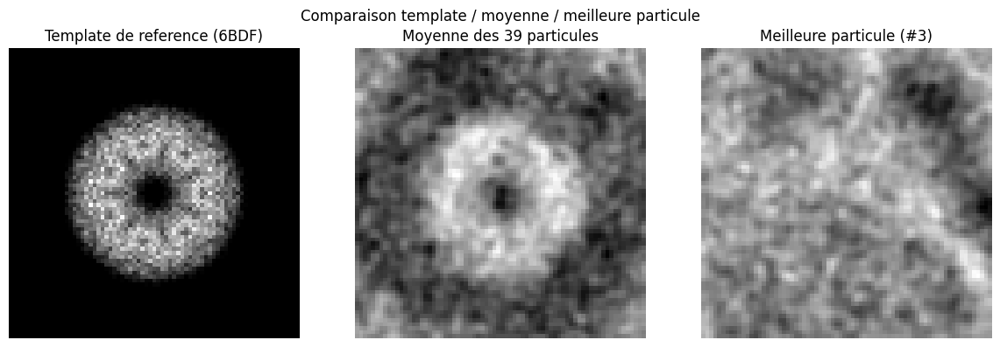

In [17]:
# moyenne de toutes les particules extraites
# si le picking est bon, ca doit ressembler au template

if len(particules) > 0:
    taille_ref = particules[0].shape
    particules_ok = [p for p in particules if p.shape == taille_ref]

    moyenne_particules = np.mean(np.stack(particules_ok, axis=0), axis=0)

    # meilleure particule = celle avec le plus de contraste
    variances = [np.var(p) for p in particules_ok]
    idx_best = int(np.argmax(variances))

    print(f'{len(particules_ok)} particules utilisees pour la moyenne')

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(template_pour_ncc, cmap='gray', origin='lower')
    axes[0].set_title('Template de reference (6BDF)')
    axes[0].axis('off')
    axes[1].imshow(moyenne_particules, cmap='gray')
    axes[1].set_title(f'Moyenne des {len(particules_ok)} particules')
    axes[1].axis('off')
    axes[2].imshow(particules_ok[idx_best], cmap='gray')
    axes[2].set_title(f'Meilleure particule (#{idx_best+1})')
    axes[2].axis('off')

    plt.suptitle('Comparaison template / moyenne / meilleure particule', fontsize=12)
    plt.tight_layout()
    plt.show()
else:
    print('Pas de particules disponibles.')

### Pipeline complet sur la micrographie entiere

Taille de la micrographie complete : (4038, 3910)
Lancement de la recherche angulaire sur image complete...
-> 116 particules trouvees sur la micrographie complete
116 particules extraites (bords exclus)


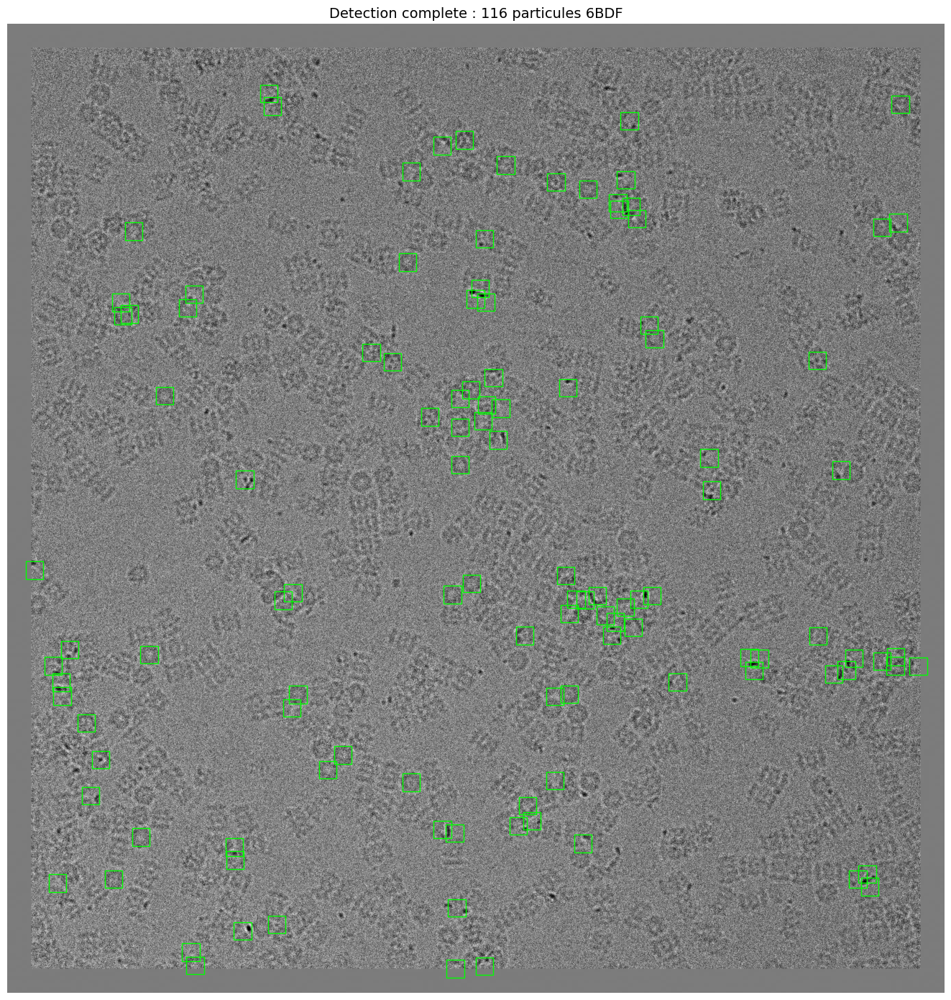

In [18]:
# pipeline complet sur toute la micrographie (pas juste le crop)
# ca prend plus de temps mais ca donne le vrai nombre de particules

print(f'Taille de la micrographie complete : {img_final.shape}')
print('Lancement de la recherche angulaire sur image complete...')

angle_step = 15
angles = np.arange(0, 360, angle_step)
carte_full = np.zeros_like(img_final, dtype=np.float32)
angles_full = np.zeros_like(img_final, dtype=np.float32)

for angle in angles:
    temp_rot = rotate(template_pour_ncc, angle, resize=False)
    ncc_angle = match_template(img_final, temp_rot, pad_input=True)
    masque = ncc_angle > carte_full
    carte_full[masque] = ncc_angle[masque]
    angles_full[masque] = angle

seuil = 0.6
pics_full = peak_local_max(carte_full, min_distance=20, threshold_rel=seuil)
print(f'-> {len(pics_full)} particules trouvees sur la micrographie complete')

# extraction
h_box, w_box = template_pour_ncc.shape
particules_full = []
for y, x in pics_full:
    y1, y2 = int(y - h_box // 2), int(y + h_box // 2)
    x1, x2 = int(x - w_box // 2), int(x + w_box // 2)
    if y1 < 0 or x1 < 0 or y2 > img_final.shape[0] or x2 > img_final.shape[1]:
        continue
    particules_full.append(img_final[y1:y2, x1:x2].copy())

print(f'{len(particules_full)} particules extraites (bords exclus)')

fig, ax = plt.subplots(figsize=(14, 14))
vmin, vmax = np.percentile(img_final, [5, 95])
ax.imshow(img_final, cmap='gray', vmin=vmin, vmax=vmax)
ax.set_title(f'Detection complete : {len(pics_full)} particules 6BDF', fontsize=14)
ax.axis('off')
for y, x in pics_full:
    rect = patches.Rectangle(
        (x - w_box / 2, y - h_box / 2), w_box, h_box,
        linewidth=1, edgecolor='lime', facecolor='none')
    ax.add_patch(rect)
plt.tight_layout()
plt.show()

### Conclusion

## Conclusion

Dans ce projet, nous avons implemente un pipeline complet de **template matching** pour detecter et extraire des particules proteiques dans une micrographie de cryo-microscopie electronique.

### Ce que nous avons fait

1. **Preprocessing** : binning (x4), normalisation Z-score, padding et denoising pour preparer la micrographie.
2. **Template** : generation d'une projection 2D du modele atomique 6BDF (PDB) par histogramme, avec normalisation Z-score et pixel size coherent (2.64 A/px).
3. **NCC** : calcul de la Normalized Cross-Correlation avec recherche angulaire (0-360 deg, pas de 15 deg) pour detecter les particules independamment de leur orientation.
4. **Extraction** : decoupage de chaque particule detectee dans une boite centree sur les coordonnees NCC.

### Limites de notre approche

- La projection 2D par histogramme est une approximation : elle ne simule pas le contraste de phase (CTF) du microscope.
- Le bruit de fond de la micrographie reelle est plus complexe qu'un simple bruit gaussien.
- En pratique, des logiciels comme **RELION** ou **crYOLO** utilisent des approches beaucoup plus sophistiquees (deep learning, correction CTF, classification 2D/3D...).

Malgre ces limitations, notre pipeline permet d'identifier automatiquement les positions candidates de la proteine 6BDF dans la micrographie, ce qui est l'objectif premier du particle picking en cryo-EM.